# Aproximació 1

## Carrega de dades i llibreries

In [1]:
%pylab inline
%matplotlib inline
%load_ext autoreload
%autoreload 2

# No volem gaires warnings
import warnings 
warnings.filterwarnings("ignore")

# Importem panda, numpy i seaborn
import pandas as pd
pd.options.display.max_rows = 999

import numpy as np
import seaborn as sb
sb.set(style="white", color_codes=True)

# També matplotlib, important per a fer gràfiques
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

import glob

# Afegim Columnes

columns = [ 'id',
            'lliga',
            'temp',
            'temp_id',
            'date',
            'hour',
            'round',
            'result',
            'localId',
            'local_goals',
            'LALGS',
            'LALGR',
            'local_wins',
            'local_losses',
            'local_draws',
            'local_ga',
            'local_gf',
            'local_avg',
            'local_form',
            'local_mark',
            'local_points',
            'visitorId',
            'visitor_goals',
            'VAVGS',
            'VAVGR',
            'visitor_wins',
            'visitor_losses',
            'visitor_draws',
            'visitor_ga',
            'visitor_gf',
            'visitor_avg',
            'visitor_form',
            'visitor_mark',
            'visitor_points'
]

full_data_set = pd.DataFrame(columns=columns)

# Carreguem el fitxer de l'aproximació 1 (en aquest cas no fa falta concatenarlo amb cap més)
for fname in glob.glob("../TF_data/1-aprox1.csv"):
    print ('Processing', fname)
    df = pd.read_csv(fname, 
                     sep=";", 
                     header=1,
                     names= columns,
                     na_values=['?'])

    df.set_index(keys = 'id', inplace = True)
    full_data_set = pd.concat([full_data_set, df],axis=0)
# Establim l'index    
    full_data_set['id'] = full_data_set.index
# I les dates com a datetime    
    full_data_set['date'] = pd.to_datetime(full_data_set.date)

print('Finished')

print 'Total', full_data_set.shape[0], 'partits'


Populating the interactive namespace from numpy and matplotlib
('Processing', '../TF_data/1-aprox1.csv')
Finished
Total 2510 partits


## Análisis i manipulació de les dades

In [2]:
full_data_set.describe(include='all').T

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
LALGR,2375,1991,1,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LALGS,2375,2049,1,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VAVGR,2375,2058,1,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VAVGS,2375,1995,1,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date,2510,446,2014-05-02 22:00:00,20,2012-08-17 22:00:00,2015-05-23 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
hour,2510,NaN,NaN,NaN,NaN,NaN,17.5203,2.70913,12,15,17,20,23
id,2510,NaN,NaN,NaN,NaN,NaN,1258.56,725.974,2,630.25,1258.5,1886.75,2516
lliga,2510,NaN,NaN,NaN,NaN,NaN,5.43187,4.10348,1,1,8,10,10
localId,2510,NaN,NaN,NaN,NaN,NaN,29.5382,19.228,1,12,27,46,68
local_avg,2443,NaN,NaN,NaN,NaN,NaN,-0.225952,17.2654,-45,-10,-2,5,89


In [3]:
# Plot de les dades, observem les distrucións (ens fixem sempre en la variable 'result' que es el nostre objectiu)
#sb.pairplot(full_data_set.dropna(), hue='result')

In [4]:
#Afegim els gols marcats i rebuts de les ultimes jornades
full_data_set['local_goals_r_1'] = full_data_set['LALGR'].str.split('-').str[0].convert_objects(convert_numeric=True)
full_data_set['local_goals_r_2'] = full_data_set['LALGR'].str.split('-').str[1].convert_objects(convert_numeric=True)
full_data_set['local_goals_r_3'] = full_data_set['LALGR'].str.split('-').str[2].convert_objects(convert_numeric=True)
full_data_set['local_goals_r_4'] = full_data_set['LALGR'].str.split('-').str[3].convert_objects(convert_numeric=True)

full_data_set['local_goals_s_1'] = full_data_set['LALGS'].str.split('-').str[0].convert_objects(convert_numeric=True)
full_data_set['local_goals_s_2'] = full_data_set['LALGS'].str.split('-').str[1].convert_objects(convert_numeric=True)
full_data_set['local_goals_s_3'] = full_data_set['LALGS'].str.split('-').str[2].convert_objects(convert_numeric=True)
full_data_set['local_goals_s_4'] = full_data_set['LALGS'].str.split('-').str[3].convert_objects(convert_numeric=True)

full_data_set['visitor_goals_r_1'] = full_data_set['VAVGR'].str.split('-').str[0].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_r_2'] = full_data_set['VAVGR'].str.split('-').str[1].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_r_3'] = full_data_set['VAVGR'].str.split('-').str[2].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_r_4'] = full_data_set['VAVGR'].str.split('-').str[3].convert_objects(convert_numeric=True)

full_data_set['visitor_goals_s_1'] = full_data_set['VAVGS'].str.split('-').str[0].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_s_2'] = full_data_set['VAVGS'].str.split('-').str[1].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_s_3'] = full_data_set['VAVGS'].str.split('-').str[2].convert_objects(convert_numeric=True)
full_data_set['visitor_goals_s_4'] = full_data_set['VAVGS'].str.split('-').str[3].convert_objects(convert_numeric=True)


In [5]:
# També afegim les victories o derrotes de les jornades anteriors

#full_data_set['local_result_0'] = full_data_set['local_form'].str[0]
full_data_set['local_result_1'] = full_data_set['local_form'].str[1]
full_data_set['local_result_2'] = full_data_set['local_form'].str[2]
full_data_set['local_result_3'] = full_data_set['local_form'].str[3]
full_data_set['local_result_4'] = full_data_set['local_form'].str[4]

#full_data_set['local_result_0'] = full_data_set['local_form'].str[0]
full_data_set['visitor_result_1'] = full_data_set['visitor_form'].str[1]
full_data_set['visitor_result_2'] = full_data_set['visitor_form'].str[2]
full_data_set['visitor_result_3'] = full_data_set['visitor_form'].str[3]
full_data_set['visitor_result_4'] = full_data_set['visitor_form'].str[4]

In [6]:
# Les transformem en numerals (igual que result) 
full_data_set = full_data_set.replace('l',0)
full_data_set = full_data_set.replace('d',1)
full_data_set = full_data_set.replace('w',2)

In [7]:
#Eliminem les dades que no podrem reproduir
full_data_set = full_data_set.drop('id', 1)
full_data_set = full_data_set.drop('date', 1)
full_data_set = full_data_set.drop('local_form', 1)
full_data_set = full_data_set.drop('visitor_form', 1)
full_data_set = full_data_set.drop('local_mark', 1)
full_data_set = full_data_set.drop('visitor_mark', 1)
full_data_set = full_data_set.drop('visitor_goals', 1)
full_data_set = full_data_set.drop('local_goals', 1)

full_data_set = full_data_set.drop('LALGR', 1)
full_data_set = full_data_set.drop('LALGS', 1)
full_data_set = full_data_set.drop('VAVGR', 1)
full_data_set = full_data_set.drop('VAVGS', 1)

In [8]:
#Num de features amb les que jugarem
full_data_set.columns.size

46

In [9]:
#Comprovem els tipus, haurien de ser tot numerals
for col in full_data_set:
    print col,'\t\t\t\t', full_data_set[col].dtypes

hour 				float64
lliga 				float64
localId 				float64
local_avg 				float64
local_draws 				float64
local_ga 				float64
local_gf 				float64
local_losses 				float64
local_points 				float64
local_wins 				float64
result 				float64
round 				float64
temp 				float64
temp_id 				float64
visitorId 				float64
visitor_avg 				float64
visitor_draws 				float64
visitor_ga 				float64
visitor_gf 				float64
visitor_losses 				float64
visitor_points 				float64
visitor_wins 				float64
local_goals_r_1 				float64
local_goals_r_2 				float64
local_goals_r_3 				float64
local_goals_r_4 				float64
local_goals_s_1 				float64
local_goals_s_2 				float64
local_goals_s_3 				float64
local_goals_s_4 				float64
visitor_goals_r_1 				float64
visitor_goals_r_2 				float64
visitor_goals_r_3 				float64
visitor_goals_r_4 				float64
visitor_goals_s_1 				float64
visitor_goals_s_2 				float64
visitor_goals_s_3 				float64
visitor_goals_s_4 				float64
local_result_1 				float64
local_result_2 				flo

In [10]:
#Hi han nulls??
full_data_set.isnull().any().any()

True

In [11]:
# Els reemplaçem per -1 (només son de resultats de jornades anteriors. Per exemple quan no n'hi ha cap!, jornada1)
full_data_set = full_data_set.fillna(0)

In [12]:
#Hi han nulls 2??
full_data_set.isnull().any().any()

False

In [13]:
#Observem que totes les dades semblen raonables (i tenen una distribució mes o menys raonable)
full_data_set.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
hour,2510.0,17.520319,2.709126,12.0,15.00,17.0,20.0,23.0
lliga,2510.0,5.431873,4.103477,1.0,1.00,8.0,10.0,10.0
localId,2510.0,29.538247,19.227963,1.0,12.00,27.0,46.0,68.0
local_avg,2510.0,-0.219920,17.033395,-45.0,-9.00,-2.0,4.0,89.0
local_draws,2510.0,4.236653,3.083237,0.0,2.00,4.0,6.0,16.0
local_ga,2510.0,25.126693,16.695187,0.0,11.00,24.0,37.0,83.0
local_gf,2510.0,24.906773,18.827807,0.0,11.00,22.0,35.0,111.0
local_losses,2510.0,6.938247,5.223480,0.0,3.00,6.0,11.0,24.0
local_points,2510.0,24.747410,18.172723,0.0,10.00,22.0,35.0,97.0
local_wins,2510.0,6.843825,5.622748,0.0,3.00,6.0,10.0,31.0


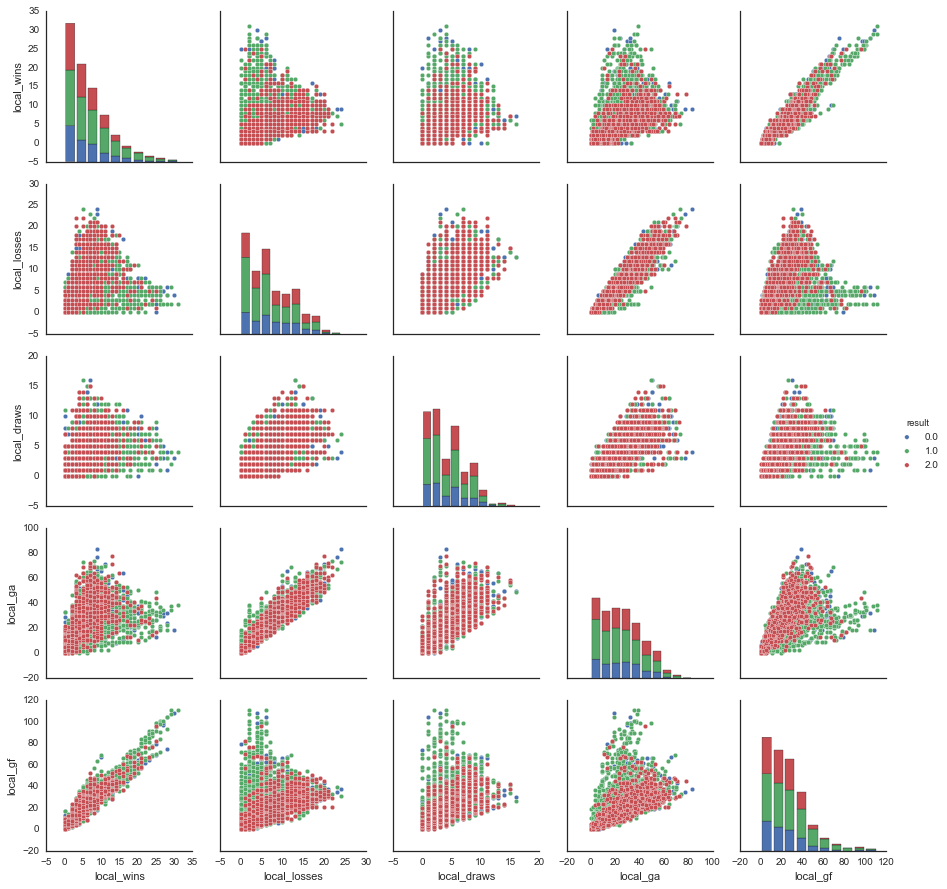

In [14]:
sb.pairplot(full_data_set.dropna(), vars=[ 'local_wins',
            'local_losses',
            'local_draws',
            'local_ga',
            'local_gf'], hue='result')

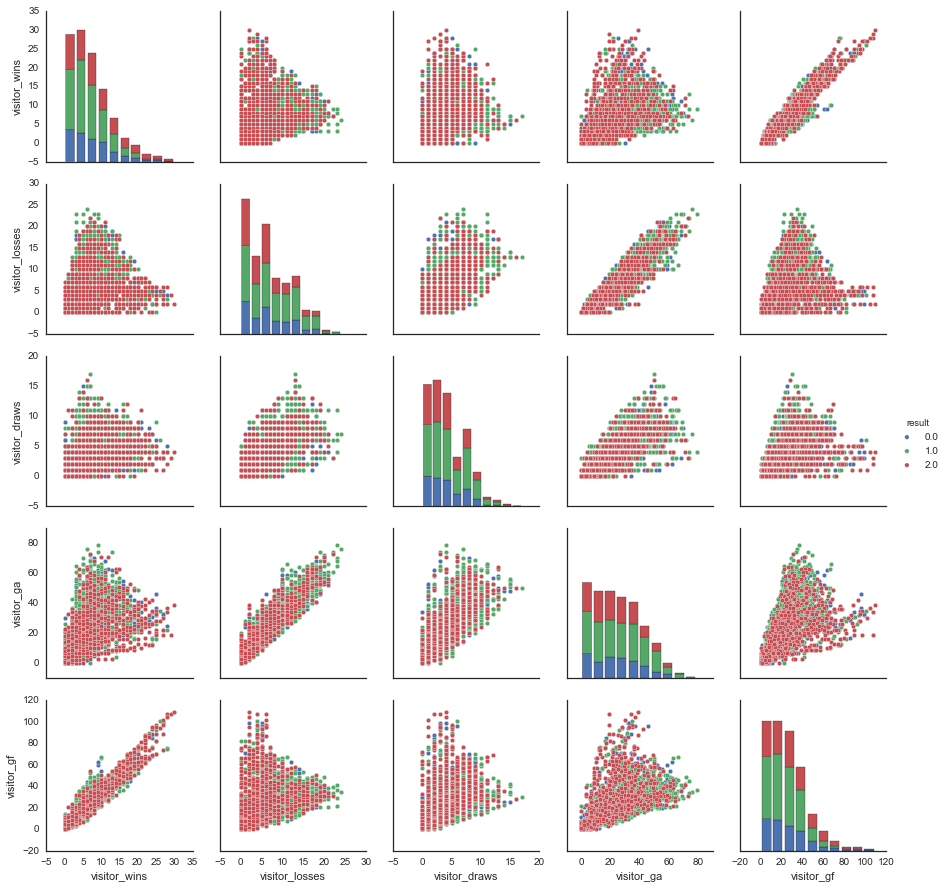

In [15]:
sb.pairplot(full_data_set.dropna(), vars=[ 'visitor_wins',
            'visitor_losses',
            'visitor_draws',
            'visitor_ga',
            'visitor_gf'], hue='result')

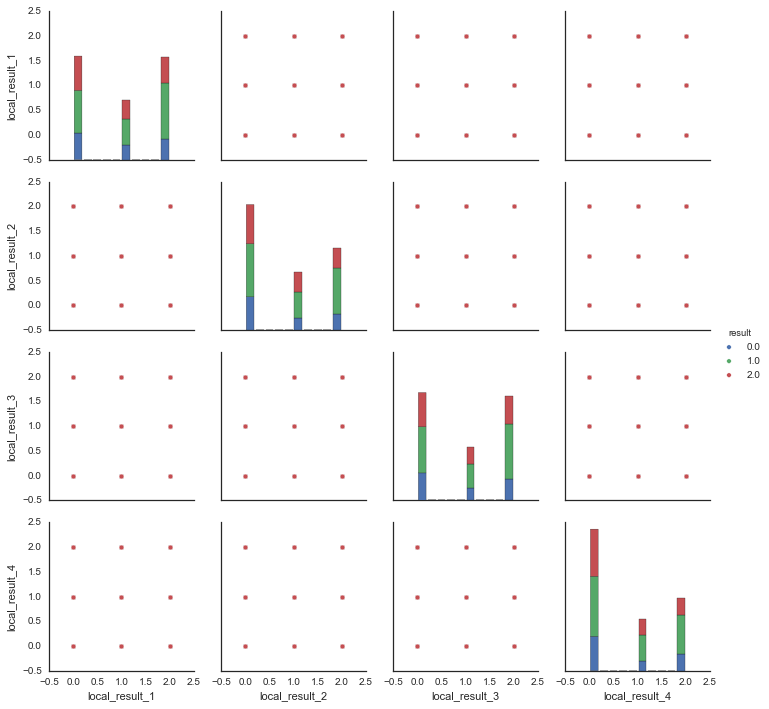

In [16]:
sb.pairplot(full_data_set.dropna(), vars=[ 'local_result_1',
                                           'local_result_2',
                                           'local_result_3',
                                           'local_result_4'], hue='result')

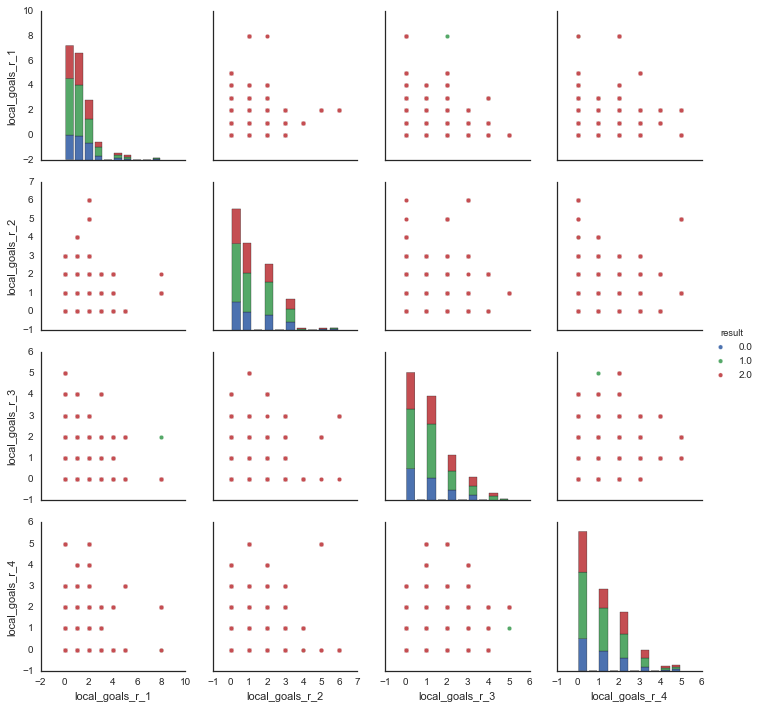

In [17]:
sb.pairplot(full_data_set.dropna(), vars=[ 'local_goals_r_1',
                                           'local_goals_r_2',
                                           'local_goals_r_3',
                                           'local_goals_r_4'], hue='result')

In [18]:
sb.pairplot(full_data_set.dropna(), hue='result')

## Construcció i análisis de resultats dels Models

In [15]:
# Definim la colmna objectiu (que volem predir)
y_name = 'result'
feature_names = full_data_set.columns.tolist()
feature_names.remove(y_name)

# Separem el data set entre totes les dades, i els resultats
X = full_data_set[feature_names]
y = full_data_set[y_name]

### Separem entre train i test  

In [16]:
from sklearn.metrics import mean_squared_error
from sklearn.cross_validation import train_test_split

(training_inputs,
 testing_inputs,
 training_classes,
 testing_classes) = train_test_split(X, y, train_size=0.75, random_state=1301, stratify=y)

### Decision TREE

In [17]:
from sklearn.tree import DecisionTreeClassifier
# Creem el classificador
decision_tree_classifier = DecisionTreeClassifier(max_features= 41, max_depth= 4)

# Entrenem amb el training
decision_tree_classifier.fit(training_inputs, training_classes)

# Validem amb el test i mesurem resultats
dt_score = decision_tree_classifier.score(testing_inputs, testing_classes)
dt_mse = mean_squared_error(testing_classes, decision_tree_classifier.predict(testing_inputs))
print "Decision Tree Score: %.4f"  % dt_score, "\nMSE: %.4f" % dt_mse 

Decision Tree Score: 0.5453 
MSE: 0.6502


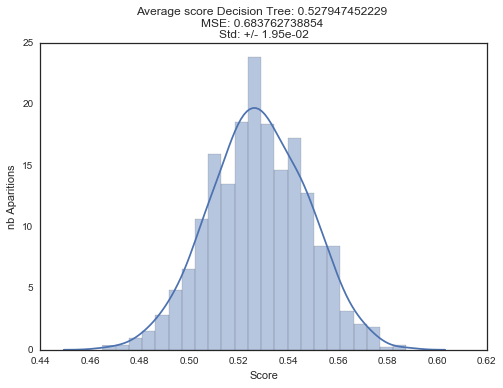

In [25]:
dt_scores = []
dt_mses = []

#Fem el mateix peró amb diversos subsets training/test (hauria de sortir una distribució normal)
for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    decision_tree_classifier = DecisionTreeClassifier(max_features= 45, max_depth= 4)
    decision_tree_classifier.fit(training_inputs, training_classes)
    dt_score = decision_tree_classifier.score(testing_inputs, testing_classes)
    dt_mse = mean_squared_error(testing_classes, decision_tree_classifier.predict(testing_inputs))
    dt_scores.append(dt_score)
    dt_mses.append(dt_mse)
    
plt.title('Average score Decision Tree: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(dt_scores),  np.mean(dt_mses), np.std(dt_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(dt_scores)

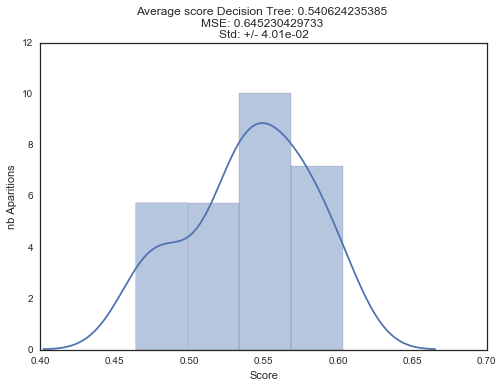

In [19]:
#Enlloc d'utilitzar training i test, provem crossvalidation 
from sklearn.cross_validation import cross_val_score

decision_tree_classifier = DecisionTreeClassifier(max_features= 45, max_depth= 4)

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
dt_scores = cross_val_score(decision_tree_classifier, X, y, cv=20)
dt_mses = cross_val_score(decision_tree_classifier, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score Decision Tree: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(dt_scores), -np.mean(dt_mses), np.std(dt_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(dt_scores)

In [27]:
decision_tree_classifier.get_params().keys()

['presort',
 'splitter',
 'max_leaf_nodes',
 'min_samples_leaf',
 'min_samples_split',
 'min_weight_fraction_leaf',
 'criterion',
 'random_state',
 'max_features',
 'max_depth',
 'class_weight']

In [25]:
#Probem un algoritme que ajuda a decidir els millors parametres d'entrada'
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

decision_tree_classifier = DecisionTreeClassifier()

parameter_grid = {'max_depth': list(range(1,10)),
                  'max_features': list(range(1,46))}

cross_validation = StratifiedKFold(y, n_folds=20)

grid_search = GridSearchCV(decision_tree_classifier,
                           param_grid=parameter_grid,
                           cv=20,
                           n_jobs=4)

grid_search.fit(X, y)
print('Best score Decision Tree: {}'.format(grid_search.best_score_))
print('Best parameters Decision Tree: {}'.format(grid_search.best_params_))

Best score Decision Tree: 0.541035856574
Best parameters Decision Tree: {'max_features': 45, 'max_depth': 4}


### KNN

#### Faig el mateix procés que abans però amb aquest metode

In [29]:
from sklearn import neighbors

# Creem el classificador
knn = neighbors.KNeighborsClassifier(n_neighbors=80, weights='distance')

# Entrenem amb el training
knn.fit(training_inputs, training_classes)

# Validem amb el test i mesurem resultats
knn_score = knn.score(testing_inputs, testing_classes)
knn_mse = mean_squared_error(testing_classes, knn.predict(testing_inputs))
print "Decision Tree Score: %.4f"  % knn_score, "\nMSE: %.4f" % knn_mse 

Decision Tree Score: 0.5303 
MSE: 0.6608


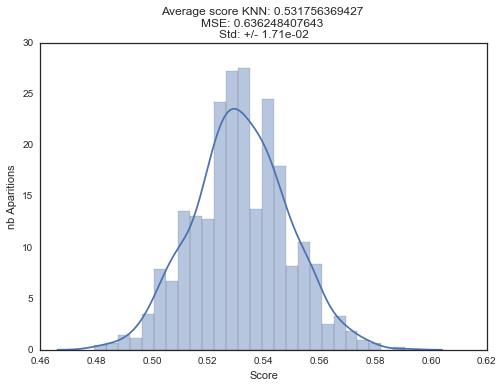

In [30]:
knn_scores = []
knn_mses = []

#Fem el mateix peró amb diversos subsets training/test (hauria de sortir una distribució normal)
for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    knn = neighbors.KNeighborsClassifier(n_neighbors= 80, weights= 'distance')
    knn.fit(training_inputs, training_classes)
    knn_score = knn.score(testing_inputs, testing_classes)
    knn_mse = mean_squared_error(testing_classes, knn.predict(testing_inputs))
    knn_scores.append(knn_score)
    knn_mses.append(knn_mse)
    
plt.title('Average score KNN: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(knn_scores),  np.mean(knn_mses), np.std(knn_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(knn_scores)

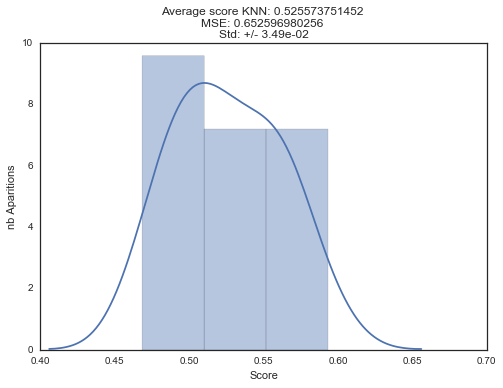

In [34]:
from sklearn.cross_validation import cross_val_score

#Enlloc d'utilitzar training i test, provem crossvalidation 
knn = neighbors.KNeighborsClassifier(n_neighbors= 100, weights= 'distance')

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
knn_scores = cross_val_score(knn, X, y, cv=20)
knn_mses = cross_val_score(knn, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score KNN: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(knn_scores), -np.mean(knn_mses), np.std(knn_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(knn_scores)

In [38]:
knn.get_params().keys()

['n_neighbors',
 'n_jobs',
 'algorithm',
 'metric',
 'metric_params',
 'p',
 'weights',
 'leaf_size']

In [35]:
#Probem un algoritme que ajuda a decidir els millors parametres d'entrada
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

knn = neighbors.KNeighborsClassifier()

parameter_grid = {'weights': ['uniform', 'distance'], 'n_neighbors': [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300]}


cross_validation = StratifiedKFold(y, n_folds=20)

grid_search = GridSearchCV(knn,
                           param_grid=parameter_grid,
                           cv=20,
                           n_jobs=4)

grid_search.fit(X, y)
print('Best score KNN: {}'.format(grid_search.best_score_))
print('Best parameters KNN: {}'.format(grid_search.best_params_))

Best score KNN: 0.52828685259
Best parameters KNN: {'n_neighbors': 100, 'weights': 'uniform'}


### SVM

In [36]:
from sklearn import svm

svmc = svm.SVC(kernel='rbf', C=1, gamma=0.0001)

svmc.fit(training_inputs, training_classes)

svmc_score = svmc.score(testing_inputs, testing_classes)
svmc_mse = mean_squared_error(testing_classes, svmc.predict(testing_inputs))
print "Support Vector Machine: %.4f"  % svmc_score, "\nMSE: %.4f" % svmc_mse 

Support Vector Machine: 0.5096 
MSE: 0.6385


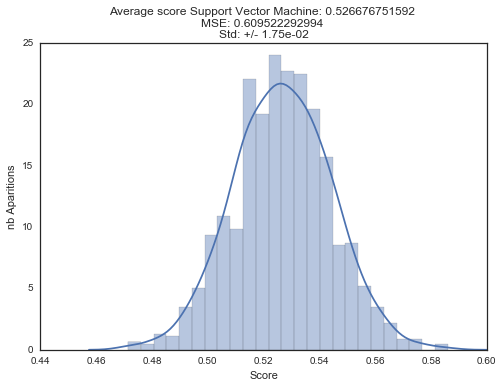

In [37]:
svmc_scores = []
svmc_mses = []

for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    svmc = svm.SVC(kernel='rbf', C=1, gamma=0.0001)
    svmc.fit(training_inputs, training_classes)
    svmc_score = svmc.score(testing_inputs, testing_classes)
    svmc_mse = mean_squared_error(testing_classes, svmc.predict(testing_inputs))
    svmc_scores.append(svmc_score)
    svmc_mses.append(svmc_mse)
    
plt.title('Average score Support Vector Machine: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(svmc_scores),  np.mean(svmc_mses), np.std(svmc_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(svmc_scores)

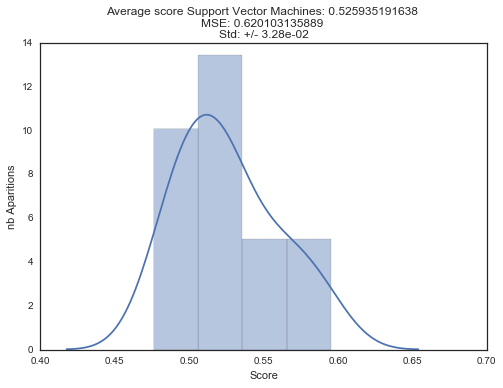

In [38]:
from sklearn.cross_validation import cross_val_score

svmc = svm.SVC(kernel='rbf', C=1, gamma=0.0001)

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
svmc_scores = cross_val_score(svmc, X, y, cv=20)
svmc_mses = cross_val_score(svmc, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score Support Vector Machines: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(svmc_scores), -np.mean(svmc_mses), np.std(svmc_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(svmc_scores)

In [55]:
clf.get_params().keys()

['kernel',
 'C',
 'verbose',
 'probability',
 'degree',
 'shrinking',
 'max_iter',
 'decision_function_shape',
 'random_state',
 'tol',
 'cache_size',
 'coef0',
 'gamma',
 'class_weight']

In [62]:
#Probem un algoritme que ajuda a decidir els millors parametres d'entrada
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

clf = svm.SVC()

parameter_grid = {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']}
 

cross_validation = StratifiedKFold(y, n_folds=20)

grid_search = GridSearchCV(clf,
                           param_grid=parameter_grid,
                           cv=cross_validation
                           )

grid_search.fit(X, y)
print('Best score SVM: {}'.format(grid_search.best_score_))
print('Best parameters SVM: {}'.format(grid_search.best_params_))

Best score SVM: 0.525896414343
Best parameters SVM: {'kernel': 'rbf', 'C': 1, 'gamma': 0.0001}


### Logistic Regression

In [39]:
from sklearn import linear_model

logistic = linear_model.LogisticRegression(C=1e8)
    
logistic.fit(training_inputs, training_classes) 

lr_score = logistic.score(testing_inputs, testing_classes)
lr_mse = mean_squared_error(testing_classes, logistic.predict(testing_inputs))
print "Logistic regression Score: %.4f"  % lr_score, "\nMSE: %.4f" % lr_mse 

Logistic regression Score: 0.5111 
MSE: 0.7277


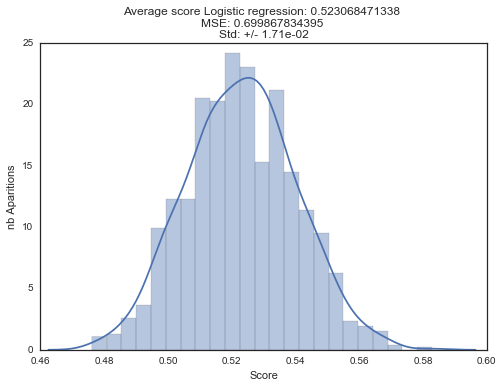

In [40]:
lr_scores = []
lr_mses = []

for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    logistic = linear_model.LogisticRegression(C=1e8)
    logistic.fit(training_inputs, training_classes)
    lr_score = logistic.score(testing_inputs, testing_classes)
    lr_mse = mean_squared_error(testing_classes, logistic.predict(testing_inputs))
    lr_scores.append(lr_score)
    lr_mses.append(lr_mse)
    
plt.title('Average score Logistic regression: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(lr_scores),  np.mean(lr_mses), np.std(lr_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(lr_scores)

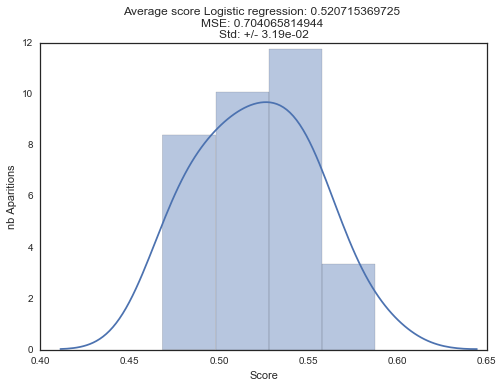

In [41]:
from sklearn.cross_validation import cross_val_score

logistic = linear_model.LogisticRegression(C=1e8)

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
lr_scores = cross_val_score(logistic, X, y, cv=20)
lr_mses = cross_val_score(logistic, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score Logistic regression: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(lr_scores), -np.mean(lr_mses), np.std(lr_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(lr_scores)

In [70]:
logistic.get_params().keys()

['warm_start',
 'C',
 'n_jobs',
 'verbose',
 'intercept_scaling',
 'fit_intercept',
 'max_iter',
 'penalty',
 'multi_class',
 'random_state',
 'dual',
 'tol',
 'solver',
 'class_weight']

In [32]:
#Probem un algoritme que ajuda a decidir els millors parametres d'entrada
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

logistic = linear_model.LogisticRegression()

parameter_grid = {'C': numpy.linspace(0.01,1000,100)},

cross_validation = StratifiedKFold(y, n_folds=20)

grid_search = GridSearchCV(logistic,
                           param_grid=parameter_grid,
                           cv=cross_validation
                           )

grid_search.fit(X, y)
print('Best score Logistic Regression: {}'.format(grid_search.best_score_))
print('Best parameters Logistic Regression: {}'.format(grid_search.best_params_))

Best score Logistic Regression: 0.529482071713
Best parameters Logistic Regression: {'C': 0.01}


#### Tampoc hem aconseguit cap resultat espectacular. Fem unes quantes proves més.

## Multiples proves

Model scores
ada_boost     0.518689
bagging       0.468903
extra_tree    0.460157
forest        0.461811
gaussian      0.482395
grad_boost    0.514682
passive       0.400466
ridge         0.524341
sgd           0.419033
tree          0.435021
xgboost       0.523499
dtype: float64


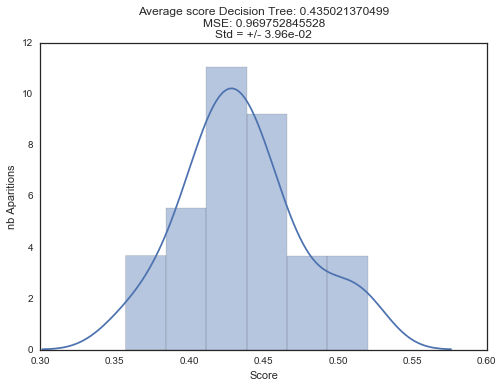

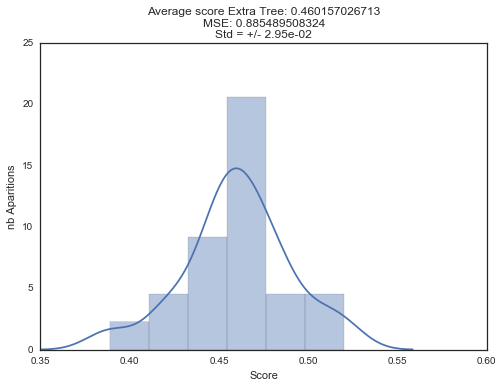

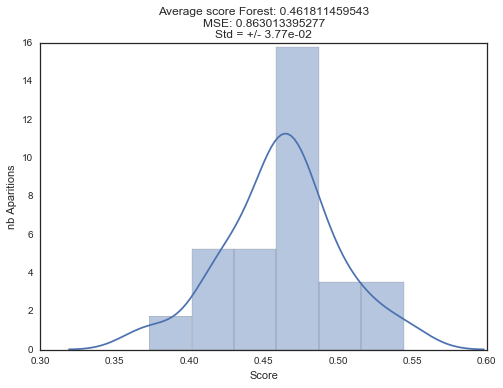

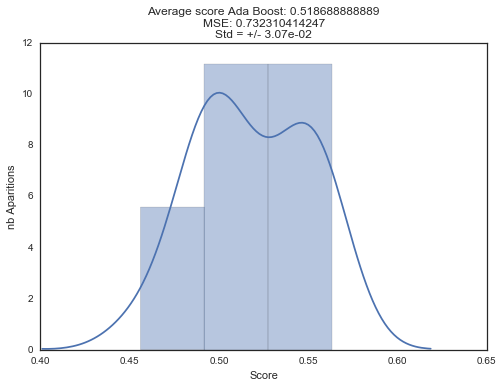

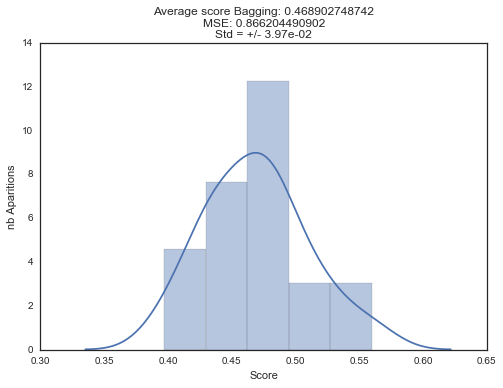

...

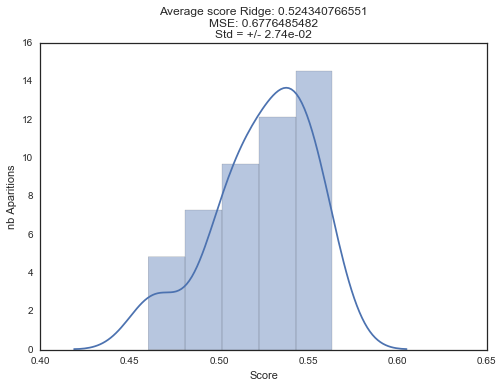

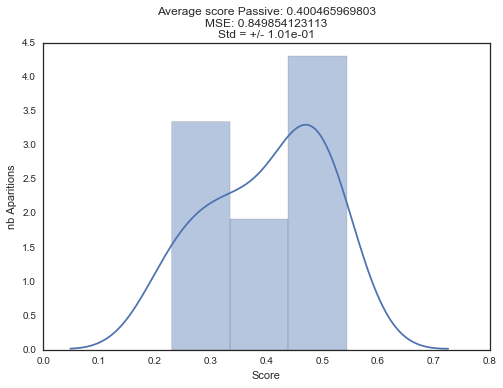

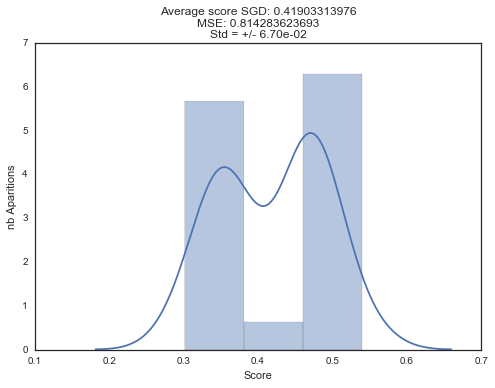

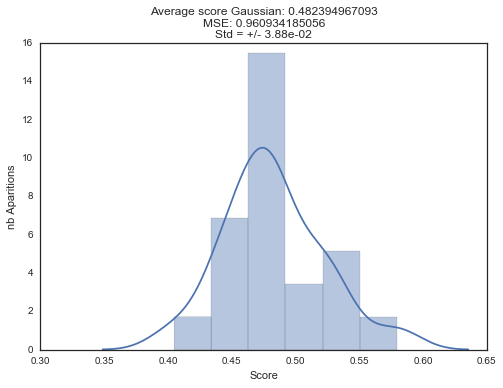

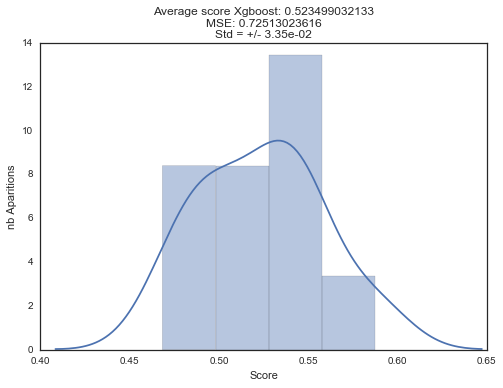

In [17]:
from sklearn import cross_validation as cv
from sklearn import tree
from sklearn import metrics
from sklearn import ensemble
from sklearn import linear_model 
from sklearn import naive_bayes 
import xgboost as xgb

skf = cv.StratifiedKFold(y, n_folds=20, shuffle=True)
scores = {}
mses = {}

def score_model(model):
    return cv.cross_val_score(model, X, y, cv=skf, n_jobs=4)

def mse_model(model):
    return cv.cross_val_score(model, X, y, cv=skf, n_jobs=4, scoring='mean_squared_error')

#Decision Tree
scores['tree'] = score_model(tree.DecisionTreeClassifier()) 
mses['tree'] = mse_model(tree.DecisionTreeClassifier())
plt.figure()
sb.distplot(scores['tree'])
plt.title('Average score Decision Tree: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['tree']), -np.mean(mses['tree']), np.std(scores['tree'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

#Extra Tree
scores['extra_tree'] = score_model(ensemble.ExtraTreesClassifier())
mses['extra_tree'] = mse_model(ensemble.ExtraTreesClassifier())
plt.figure()
sb.distplot(scores['extra_tree'])
plt.title('Average score Extra Tree: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['extra_tree']), -np.mean(mses['extra_tree']), np.std(scores['extra_tree'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['forest'] = score_model(ensemble.RandomForestClassifier())
mses['forest'] = mse_model(ensemble.RandomForestClassifier())
plt.figure()
sb.distplot(scores['forest'])
plt.title('Average score Forest: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['forest']), -np.mean(mses['forest']), np.std(scores['forest'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['ada_boost'] = score_model(ensemble.AdaBoostClassifier())
mses['ada_boost'] = mse_model(ensemble.AdaBoostClassifier())
plt.figure()
sb.distplot(scores['ada_boost'])
plt.title('Average score Ada Boost: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['ada_boost']), -np.mean(mses['ada_boost']), np.std(scores['ada_boost'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['bagging'] = score_model(ensemble.BaggingClassifier())
mses['bagging'] = mse_model(ensemble.BaggingClassifier())
plt.figure()
sb.distplot(scores['bagging'])
plt.title('Average score Bagging: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['bagging']), -np.mean(mses['bagging']), np.std(scores['bagging'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['grad_boost'] = score_model(ensemble.GradientBoostingClassifier())
mses['grad_boost'] = mse_model(ensemble.GradientBoostingClassifier())
plt.figure()
sb.distplot(scores['grad_boost'])
plt.title('Average score Gradient Boosting: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['grad_boost']), -np.mean(mses['grad_boost']), np.std(scores['grad_boost'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['ridge'] = score_model(linear_model.RidgeClassifier())
mses['ridge'] = mse_model(linear_model.RidgeClassifier())
plt.figure()
sb.distplot(scores['ridge'])
plt.title('Average score Ridge: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['ridge']), -np.mean(mses['ridge']), np.std(scores['ridge'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['passive'] = score_model(linear_model.PassiveAggressiveClassifier())
mses['passive'] = mse_model(linear_model.PassiveAggressiveClassifier())
plt.figure()
sb.distplot(scores['passive'])
plt.title('Average score Passive: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['passive']), -np.mean(mses['passive']), np.std(scores['passive'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['sgd'] = score_model(linear_model.SGDClassifier())
mses['sgd'] = mse_model(linear_model.SGDClassifier())
plt.figure()
sb.distplot(scores['sgd'])
plt.title('Average score SGD: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['sgd']), -np.mean(mses['sgd']), np.std(scores['sgd'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['gaussian'] = score_model(naive_bayes.GaussianNB())
mses['gaussian'] = mse_model(naive_bayes.GaussianNB())
plt.figure()
sb.distplot(scores['gaussian'])
plt.title('Average score Gaussian: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['gaussian']), -np.mean(mses['gaussian']), np.std(scores['gaussian'])))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

scores['xgboost'] = score_model(xgb.XGBClassifier())
mses['xgboost'] = mse_model(xgb.XGBClassifier())
plt.figure()
sb.distplot(scores['xgboost'])
plt.title('Average score Xgboost: {}\nMSE: {}\nStd = +/- {:.2e}'.format(
        np.mean(scores['xgboost']), -np.mean(mses['xgboost']), np.std(scores['xgboost'])))
plt.ylabel('nb Aparitions')

plt.xlabel('Score')

# Print the scores
model_scores = pd.DataFrame(scores).mean()

print('Model scores\n{}'.format(model_scores))

#### Hmm Intentarem amb Xgboost i random forests.

### XGBOOST

In [43]:
import xgboost as xgb

xgbo = xgb.XGBClassifier()

xgbo.fit(training_inputs, training_classes,  eval_metric="auc")

xgbo_score = xgbo.score(testing_inputs, testing_classes)
xgbo_mse = mean_squared_error(testing_classes, xgbo.predict(testing_inputs))
print "XGBOOST Score: %.4f"  % xgbo_score, "\nMSE: %.4f" % xgbo_mse 

XGBOOST Score: 0.5159 
MSE: 0.7898


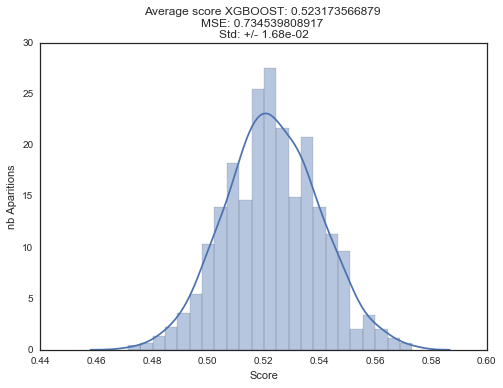

In [44]:
xgbo_scores = []
xgbo_mses = []

for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    xgbo.fit(training_inputs, training_classes)
    xgbo_score = xgbo.score(testing_inputs, testing_classes)
    xgbo_mse = mean_squared_error(testing_classes, xgbo.predict(testing_inputs))
    xgbo_scores.append(xgbo_score)
    xgbo_mses.append(xgbo_mse)

    
plt.title('Average score XGBOOST: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(xgbo_scores),  np.mean(xgbo_mses), np.std(xgbo_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(xgbo_scores)

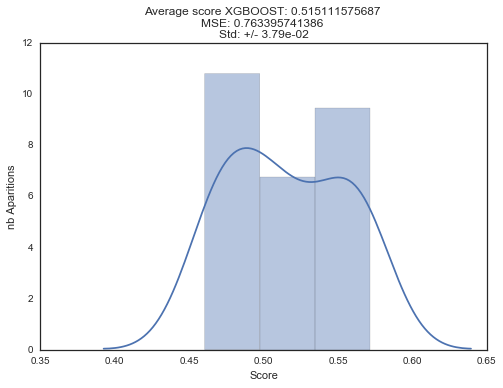

In [45]:
from sklearn.cross_validation import cross_val_score

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
xgbo_scores = cross_val_score(xgbo, X, y, cv=20)
xgbo_mses = cross_val_score(xgbo, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score XGBOOST: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(xgbo_scores), -np.mean(xgbo_mses), np.std(xgbo_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(xgbo_scores)

In [76]:
#Probem un algoritme que ajuda a decidir els millors parametres d'entrada
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import StratifiedKFold

xgbo = xgb.XGBClassifier()

parameter_grid = {
    'learning_rate': [0.05, 0.1, 0.3],
    'max_depth': [5, 6, 9, 12],
    'n_estimators': [100,200,400,500,1000]
}
 

cross_validation = StratifiedKFold(y, n_folds=20)

grid_search = GridSearchCV(xgbo,
                           param_grid=parameter_grid,
                           cv=cross_validation
                           )

grid_search.fit(X, y)
print('Best score XGBOOST: {}'.format(grid_search.best_score_))
print('Best parameters XGBOOST: {}'.format(grid_search.best_params_))

Best score XGBOOST: 0.513545816733
Best parameters XGBOOST: {'n_estimators': 100, 'learning_rate': 0.05, 'max_depth': 5}


### Random Forest

In [50]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(bootstrap=False, min_samples_leaf=2, n_estimators=410, min_samples_split=10,
                            criterion='gini', max_features= 34, max_depth= 5)

rf.fit(training_inputs, training_classes)

rf_score = rf.score(testing_inputs, testing_classes)
rf_mse = mean_squared_error(testing_classes, rf.predict(testing_inputs))
print "Random Forest Score: %.4f"  % rf_score, "\nMSE: %.4f" % rf_mse 

Random Forest Score: 0.5780 
MSE: 0.5701


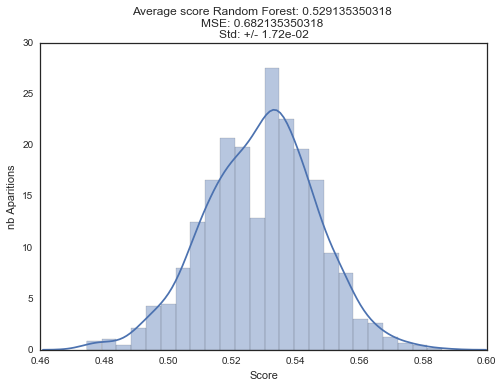

In [54]:
rf_scores = []
rf_mses = []

#Fem el mateix peró amb diversos subsets training/test (hauria de sortir una distribució normal)
for repetition in range(1000):
    (training_inputs,
     testing_inputs,
     training_classes,
     testing_classes) = train_test_split(X, y, train_size=0.75)
    
    rf.fit(training_inputs, training_classes)
    rf_score = rf.score(testing_inputs, testing_classes)
    rf_mse = mean_squared_error(testing_classes, rf.predict(testing_inputs))
    rf_scores.append(rf_score)
    rf_mses.append(rf_mse)
    
plt.title('Average score Random Forest: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(rf_scores),  np.mean(rf_mses), np.std(rf_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')


sb.distplot(rf_scores)

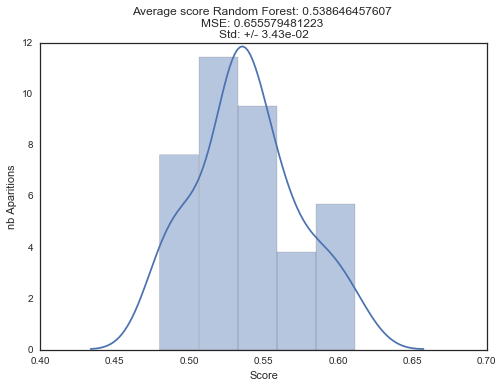

In [53]:
from sklearn.cross_validation import cross_val_score

#Al igual que abans, hauria de retornar una distribució normal (utilitzo X i y directament!)
rf_scores = cross_val_score(rf, X, y, cv=20)
rf_mses = cross_val_score(rf, X, y, cv=20, scoring='mean_squared_error')

plt.title('Average score Random Forest: {} \nMSE: {} \nStd: +/- {:.2e}'.format(
        np.mean(rf_scores), -np.mean(rf_mses), np.std(rf_scores)))
plt.ylabel('nb Aparitions')
plt.xlabel('Score')

sb.distplot(rf_scores)

In [55]:
rf.get_params().keys()

['warm_start',
 'oob_score',
 'n_jobs',
 'verbose',
 'max_leaf_nodes',
 'bootstrap',
 'min_samples_leaf',
 'n_estimators',
 'min_samples_split',
 'min_weight_fraction_leaf',
 'criterion',
 'random_state',
 'max_features',
 'max_depth',
 'class_weight']

In [53]:
from sklearn.grid_search import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
                                    
cross_validation = StratifiedKFold(y, n_folds=15)

param_dist = {"max_depth": range(1,10),
              "n_estimators":range(10,1000,100),
              "max_features": list(range(1,45)),
              "min_samples_split": sp_randint(1, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

n_iter_search = 20
grid_search = RandomizedSearchCV(rf, param_dist, n_iter=n_iter_search, cv=cross_validation)

grid_search.fit(X, y)
print('Best score Random Forest: {}'.format(grid_search.best_score_))
print('Best parameters Random Forest: {}'.format(grid_search.best_params_))

Best score: 0.535856573705
Best parameters: {'bootstrap': False, 'min_samples_leaf': 2, 'n_estimators': 410, 'min_samples_split': 10, 'criterion': 'gini', 'max_features': 34, 'max_depth': 5}


## Conclusions preliminars aprox 1

Hem millorat els resultats de la baseline, però tampoc estem per tirar cohets. Millors resultats

Random Forest: 0.53864
Decision tree: 0.54141